# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

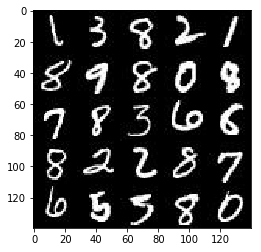

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

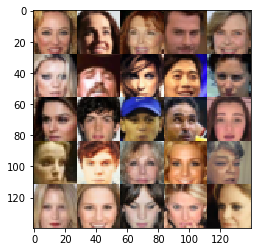

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.4.1
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_real = tf.placeholder(tf.float32, (None, image_height, image_width, image_channels), name="input_real")
    input_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate = tf.placeholder(tf.float32, name='learn_rate')
    return input_real,input_z,learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope("discriminator", reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same') #14x14x64
        x1 = tf.maximum(alpha*x1, x1) 

        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same') #7x7x128
        x2 = tf.layers.batch_normalization(x2, training=True) #We are not using this for inference, so makes sense tokeep it true
        x2 = tf.maximum(alpha*x2, x2)
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='same') #4x4x256
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha*x3, x3)
        
        x4 = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(x4, 1)
        out = tf.sigmoid(logits)
        
        return out,logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    
    with tf.variable_scope("generator", reuse=not is_train):
        x1 = tf.layers.dense(z, 2*2*256)
        x1 = tf.reshape(x1, (-1,2,2,256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1, x1) #Leaky Relu, shape 2x2x256
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='valid') #Depth 7x7x128, filter 5x5
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same') #14x14x64
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3) #16x16x56

        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same') #28x28xoutput_channel_dim
        out = tf.tanh(logits)

        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    #You know this, get loss output,(logits) for both, sigmoid_cross_entropy_with_logits, use the trick of labels 
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
                        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=0.9*(tf.ones_like(d_model_real))))
    d_loss_fake = tf.reduce_mean(
                        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
                        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    print_every = 10
    show_every = 100
    
    input_real, input_z, learn_rate = model_inputs(*data_shape[1:], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[-1])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, 0.5)

    sample_z = tf.random_uniform((72, z_dim), -1, 1)

    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                                
                #Running the optimizers
                _ = sess.run(d_opt, feed_dict={input_real:batch_images, input_z:batch_z, learn_rate:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real:batch_images, input_z:batch_z, learn_rate:learning_rate})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                if steps % show_every == 0:
                    show_generator_output(sess, 72, sample_z, data_shape[-1], data_image_mode)
                
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.7641... Generator Loss: 7.8979
Epoch 1/2... Discriminator Loss: 0.7268... Generator Loss: 1.8525
Epoch 1/2... Discriminator Loss: 0.6023... Generator Loss: 7.1803
Epoch 1/2... Discriminator Loss: 1.7109... Generator Loss: 0.3895
Epoch 1/2... Discriminator Loss: 0.6878... Generator Loss: 6.6192
Epoch 1/2... Discriminator Loss: 1.0994... Generator Loss: 7.7217
Epoch 1/2... Discriminator Loss: 0.4702... Generator Loss: 3.2569
Epoch 1/2... Discriminator Loss: 0.5934... Generator Loss: 1.9640
Epoch 1/2... Discriminator Loss: 0.5466... Generator Loss: 2.1884
Epoch 1/2... Discriminator Loss: 0.5105... Generator Loss: 2.4430


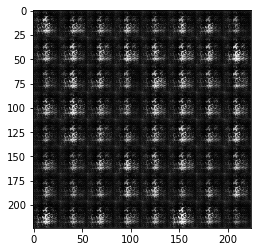

Epoch 1/2... Discriminator Loss: 0.4373... Generator Loss: 3.4430
Epoch 1/2... Discriminator Loss: 0.4487... Generator Loss: 2.9241
Epoch 1/2... Discriminator Loss: 0.3875... Generator Loss: 4.0952
Epoch 1/2... Discriminator Loss: 0.4555... Generator Loss: 3.2667
Epoch 1/2... Discriminator Loss: 0.3922... Generator Loss: 3.8641
Epoch 1/2... Discriminator Loss: 0.5230... Generator Loss: 3.4469
Epoch 1/2... Discriminator Loss: 0.6322... Generator Loss: 1.8367
Epoch 1/2... Discriminator Loss: 0.6025... Generator Loss: 1.8486
Epoch 1/2... Discriminator Loss: 0.4827... Generator Loss: 3.8131
Epoch 1/2... Discriminator Loss: 0.5164... Generator Loss: 2.6797


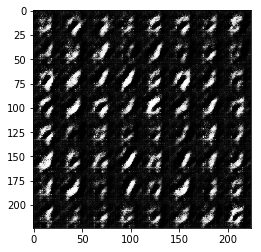

Epoch 1/2... Discriminator Loss: 0.4825... Generator Loss: 3.3522
Epoch 1/2... Discriminator Loss: 0.7227... Generator Loss: 1.5060
Epoch 1/2... Discriminator Loss: 0.6731... Generator Loss: 3.6712
Epoch 1/2... Discriminator Loss: 0.6641... Generator Loss: 1.8152
Epoch 1/2... Discriminator Loss: 0.7392... Generator Loss: 1.6273
Epoch 1/2... Discriminator Loss: 0.4743... Generator Loss: 4.2752
Epoch 1/2... Discriminator Loss: 0.9533... Generator Loss: 1.1650
Epoch 1/2... Discriminator Loss: 0.5773... Generator Loss: 2.0962
Epoch 1/2... Discriminator Loss: 0.5495... Generator Loss: 2.2218
Epoch 1/2... Discriminator Loss: 0.5561... Generator Loss: 3.0472


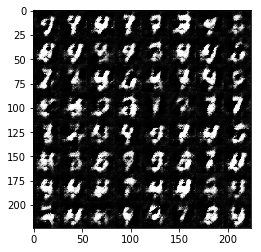

Epoch 1/2... Discriminator Loss: 0.6096... Generator Loss: 2.7685
Epoch 1/2... Discriminator Loss: 1.0947... Generator Loss: 0.8657
Epoch 1/2... Discriminator Loss: 0.6861... Generator Loss: 2.1265
Epoch 1/2... Discriminator Loss: 0.8189... Generator Loss: 1.6349
Epoch 1/2... Discriminator Loss: 0.5608... Generator Loss: 2.3206
Epoch 1/2... Discriminator Loss: 1.2657... Generator Loss: 5.1345
Epoch 1/2... Discriminator Loss: 0.6103... Generator Loss: 2.4721
Epoch 1/2... Discriminator Loss: 0.6632... Generator Loss: 1.6249
Epoch 1/2... Discriminator Loss: 1.0546... Generator Loss: 0.8508
Epoch 1/2... Discriminator Loss: 0.5967... Generator Loss: 2.3611


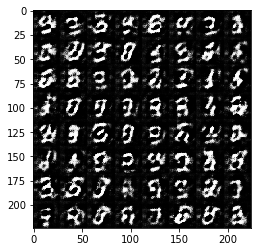

Epoch 1/2... Discriminator Loss: 1.0796... Generator Loss: 1.0193
Epoch 1/2... Discriminator Loss: 0.6906... Generator Loss: 2.4001
Epoch 1/2... Discriminator Loss: 0.6553... Generator Loss: 1.7997
Epoch 1/2... Discriminator Loss: 0.7153... Generator Loss: 1.9332
Epoch 1/2... Discriminator Loss: 0.5982... Generator Loss: 2.7100
Epoch 1/2... Discriminator Loss: 0.6139... Generator Loss: 2.7633
Epoch 1/2... Discriminator Loss: 0.6483... Generator Loss: 1.6492
Epoch 1/2... Discriminator Loss: 0.6638... Generator Loss: 3.1784
Epoch 1/2... Discriminator Loss: 0.8449... Generator Loss: 1.3134
Epoch 1/2... Discriminator Loss: 0.6228... Generator Loss: 2.3763


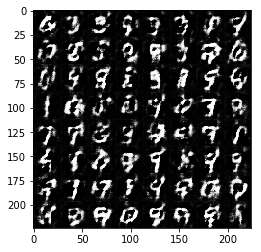

Epoch 1/2... Discriminator Loss: 0.6367... Generator Loss: 2.9700
Epoch 1/2... Discriminator Loss: 1.1784... Generator Loss: 0.7362
Epoch 1/2... Discriminator Loss: 0.7260... Generator Loss: 1.6233
Epoch 1/2... Discriminator Loss: 0.7412... Generator Loss: 1.4002
Epoch 1/2... Discriminator Loss: 0.6955... Generator Loss: 1.7160
Epoch 1/2... Discriminator Loss: 0.6644... Generator Loss: 1.6283
Epoch 1/2... Discriminator Loss: 0.6243... Generator Loss: 2.1187
Epoch 1/2... Discriminator Loss: 0.8945... Generator Loss: 2.7211
Epoch 1/2... Discriminator Loss: 0.6833... Generator Loss: 1.6464
Epoch 1/2... Discriminator Loss: 0.6975... Generator Loss: 1.7612


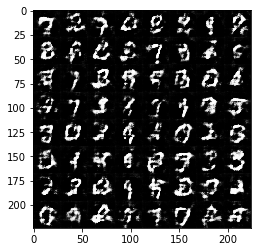

Epoch 1/2... Discriminator Loss: 0.7008... Generator Loss: 3.0491
Epoch 1/2... Discriminator Loss: 0.7698... Generator Loss: 1.3909
Epoch 1/2... Discriminator Loss: 0.6602... Generator Loss: 1.7448
Epoch 1/2... Discriminator Loss: 0.6626... Generator Loss: 2.1833
Epoch 1/2... Discriminator Loss: 0.5698... Generator Loss: 2.6344
Epoch 1/2... Discriminator Loss: 0.6629... Generator Loss: 2.2676
Epoch 1/2... Discriminator Loss: 0.6853... Generator Loss: 1.5685
Epoch 1/2... Discriminator Loss: 0.6317... Generator Loss: 1.7935
Epoch 1/2... Discriminator Loss: 1.2388... Generator Loss: 0.9253
Epoch 1/2... Discriminator Loss: 0.7318... Generator Loss: 1.4290


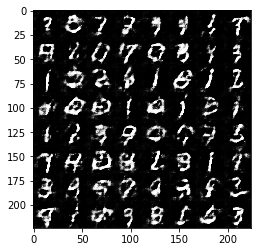

Epoch 1/2... Discriminator Loss: 0.7297... Generator Loss: 1.7865
Epoch 1/2... Discriminator Loss: 0.8913... Generator Loss: 1.1208
Epoch 1/2... Discriminator Loss: 0.9371... Generator Loss: 1.1800
Epoch 1/2... Discriminator Loss: 0.7343... Generator Loss: 1.6210
Epoch 1/2... Discriminator Loss: 0.7006... Generator Loss: 1.7019
Epoch 1/2... Discriminator Loss: 0.8537... Generator Loss: 1.2250
Epoch 1/2... Discriminator Loss: 0.8208... Generator Loss: 1.2052
Epoch 1/2... Discriminator Loss: 0.7794... Generator Loss: 1.5489
Epoch 1/2... Discriminator Loss: 0.8625... Generator Loss: 1.1410
Epoch 1/2... Discriminator Loss: 1.2440... Generator Loss: 0.6699


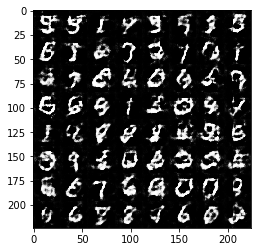

Epoch 1/2... Discriminator Loss: 1.0681... Generator Loss: 0.8019
Epoch 1/2... Discriminator Loss: 0.8162... Generator Loss: 1.3089
Epoch 1/2... Discriminator Loss: 0.8560... Generator Loss: 1.1652
Epoch 1/2... Discriminator Loss: 0.6419... Generator Loss: 1.7956
Epoch 1/2... Discriminator Loss: 0.9906... Generator Loss: 0.9211
Epoch 1/2... Discriminator Loss: 0.6478... Generator Loss: 1.7348
Epoch 1/2... Discriminator Loss: 0.7580... Generator Loss: 2.0376
Epoch 1/2... Discriminator Loss: 0.7220... Generator Loss: 1.8164
Epoch 1/2... Discriminator Loss: 0.8902... Generator Loss: 2.9995
Epoch 1/2... Discriminator Loss: 0.7825... Generator Loss: 2.4564


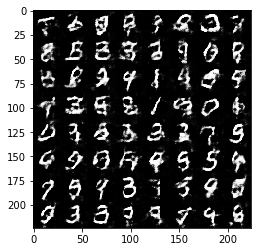

Epoch 1/2... Discriminator Loss: 0.7786... Generator Loss: 1.4123
Epoch 1/2... Discriminator Loss: 0.7455... Generator Loss: 2.5220
Epoch 1/2... Discriminator Loss: 0.6454... Generator Loss: 2.2278
Epoch 1/2... Discriminator Loss: 0.7142... Generator Loss: 1.9365
Epoch 1/2... Discriminator Loss: 0.9449... Generator Loss: 2.2801
Epoch 1/2... Discriminator Loss: 0.8315... Generator Loss: 1.1685
Epoch 1/2... Discriminator Loss: 0.9133... Generator Loss: 0.9663
Epoch 1/2... Discriminator Loss: 1.3145... Generator Loss: 0.6085
Epoch 1/2... Discriminator Loss: 0.7449... Generator Loss: 1.5060
Epoch 1/2... Discriminator Loss: 0.6465... Generator Loss: 1.6451


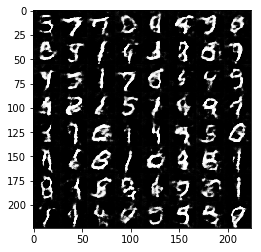

Epoch 1/2... Discriminator Loss: 0.8058... Generator Loss: 1.9732
Epoch 1/2... Discriminator Loss: 0.7105... Generator Loss: 1.3381
Epoch 1/2... Discriminator Loss: 1.6582... Generator Loss: 0.5380
Epoch 1/2... Discriminator Loss: 0.6099... Generator Loss: 1.7288
Epoch 1/2... Discriminator Loss: 0.8199... Generator Loss: 1.2983
Epoch 1/2... Discriminator Loss: 0.6688... Generator Loss: 1.6834
Epoch 1/2... Discriminator Loss: 0.9451... Generator Loss: 1.0117
Epoch 1/2... Discriminator Loss: 0.6748... Generator Loss: 1.5282
Epoch 1/2... Discriminator Loss: 0.7583... Generator Loss: 1.6526
Epoch 1/2... Discriminator Loss: 0.7074... Generator Loss: 1.6950


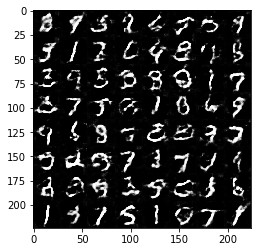

Epoch 1/2... Discriminator Loss: 0.8071... Generator Loss: 1.1966
Epoch 1/2... Discriminator Loss: 0.9114... Generator Loss: 0.9974
Epoch 1/2... Discriminator Loss: 1.2876... Generator Loss: 0.7099
Epoch 1/2... Discriminator Loss: 0.8309... Generator Loss: 1.1236
Epoch 1/2... Discriminator Loss: 0.7006... Generator Loss: 1.8429
Epoch 1/2... Discriminator Loss: 1.3929... Generator Loss: 0.5316
Epoch 1/2... Discriminator Loss: 0.7569... Generator Loss: 1.7899
Epoch 1/2... Discriminator Loss: 1.3307... Generator Loss: 0.6123
Epoch 1/2... Discriminator Loss: 1.0260... Generator Loss: 0.9026
Epoch 1/2... Discriminator Loss: 0.8588... Generator Loss: 1.5831


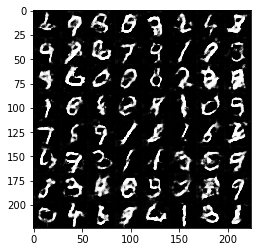

Epoch 1/2... Discriminator Loss: 0.8694... Generator Loss: 1.0960
Epoch 1/2... Discriminator Loss: 0.7512... Generator Loss: 1.4573
Epoch 1/2... Discriminator Loss: 0.7838... Generator Loss: 1.3760
Epoch 1/2... Discriminator Loss: 1.5923... Generator Loss: 0.4356
Epoch 1/2... Discriminator Loss: 0.7368... Generator Loss: 1.5702
Epoch 1/2... Discriminator Loss: 0.6783... Generator Loss: 1.5583
Epoch 1/2... Discriminator Loss: 0.7784... Generator Loss: 1.2681
Epoch 1/2... Discriminator Loss: 0.9666... Generator Loss: 2.6933
Epoch 1/2... Discriminator Loss: 0.7877... Generator Loss: 1.5442
Epoch 1/2... Discriminator Loss: 0.7272... Generator Loss: 2.1418


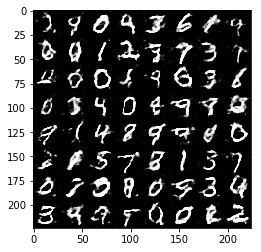

Epoch 1/2... Discriminator Loss: 0.6090... Generator Loss: 1.9993
Epoch 1/2... Discriminator Loss: 0.6786... Generator Loss: 1.6153
Epoch 1/2... Discriminator Loss: 0.6567... Generator Loss: 1.7623
Epoch 1/2... Discriminator Loss: 0.6888... Generator Loss: 2.0844
Epoch 1/2... Discriminator Loss: 1.7600... Generator Loss: 0.4533
Epoch 1/2... Discriminator Loss: 0.8242... Generator Loss: 1.2617
Epoch 1/2... Discriminator Loss: 0.7210... Generator Loss: 1.6154
Epoch 1/2... Discriminator Loss: 0.7746... Generator Loss: 3.0181
Epoch 1/2... Discriminator Loss: 0.7182... Generator Loss: 1.3241
Epoch 1/2... Discriminator Loss: 0.6900... Generator Loss: 1.4082


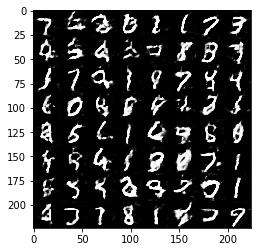

Epoch 1/2... Discriminator Loss: 0.7360... Generator Loss: 1.3132
Epoch 1/2... Discriminator Loss: 1.3962... Generator Loss: 0.5323
Epoch 1/2... Discriminator Loss: 1.0366... Generator Loss: 0.8776
Epoch 1/2... Discriminator Loss: 0.6649... Generator Loss: 1.7906
Epoch 1/2... Discriminator Loss: 0.6833... Generator Loss: 1.3849
Epoch 1/2... Discriminator Loss: 0.8813... Generator Loss: 1.0562
Epoch 1/2... Discriminator Loss: 0.6202... Generator Loss: 1.9612
Epoch 1/2... Discriminator Loss: 0.6187... Generator Loss: 1.6055
Epoch 1/2... Discriminator Loss: 0.9249... Generator Loss: 1.0123
Epoch 1/2... Discriminator Loss: 2.8448... Generator Loss: 0.1644


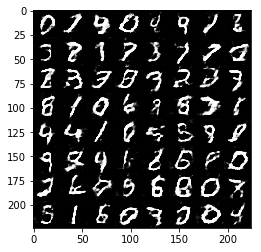

Epoch 2/2... Discriminator Loss: 0.6861... Generator Loss: 1.6736
Epoch 2/2... Discriminator Loss: 0.5831... Generator Loss: 2.3299
Epoch 2/2... Discriminator Loss: 0.6319... Generator Loss: 1.7601
Epoch 2/2... Discriminator Loss: 0.5819... Generator Loss: 1.9741
Epoch 2/2... Discriminator Loss: 0.6145... Generator Loss: 1.6446
Epoch 2/2... Discriminator Loss: 0.6461... Generator Loss: 1.7938
Epoch 2/2... Discriminator Loss: 0.6417... Generator Loss: 1.5149
Epoch 2/2... Discriminator Loss: 0.6832... Generator Loss: 1.4387
Epoch 2/2... Discriminator Loss: 0.7170... Generator Loss: 1.3832
Epoch 2/2... Discriminator Loss: 0.6892... Generator Loss: 1.4142


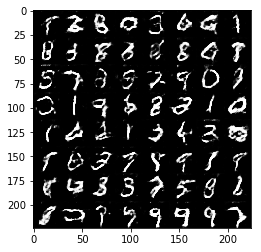

Epoch 2/2... Discriminator Loss: 1.6811... Generator Loss: 0.4462
Epoch 2/2... Discriminator Loss: 0.8197... Generator Loss: 1.2222
Epoch 2/2... Discriminator Loss: 0.7317... Generator Loss: 1.3630
Epoch 2/2... Discriminator Loss: 0.6540... Generator Loss: 1.5702
Epoch 2/2... Discriminator Loss: 0.6712... Generator Loss: 1.5004
Epoch 2/2... Discriminator Loss: 0.5932... Generator Loss: 1.8277
Epoch 2/2... Discriminator Loss: 0.6805... Generator Loss: 1.4246
Epoch 2/2... Discriminator Loss: 0.6321... Generator Loss: 1.9991
Epoch 2/2... Discriminator Loss: 0.5680... Generator Loss: 1.7262
Epoch 2/2... Discriminator Loss: 1.0398... Generator Loss: 0.8714


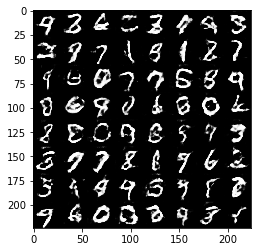

Epoch 2/2... Discriminator Loss: 0.7586... Generator Loss: 2.5635
Epoch 2/2... Discriminator Loss: 0.7712... Generator Loss: 1.1978
Epoch 2/2... Discriminator Loss: 0.6192... Generator Loss: 1.6384
Epoch 2/2... Discriminator Loss: 0.6991... Generator Loss: 1.4023
Epoch 2/2... Discriminator Loss: 0.7544... Generator Loss: 1.2078
Epoch 2/2... Discriminator Loss: 0.5827... Generator Loss: 1.8193
Epoch 2/2... Discriminator Loss: 0.6058... Generator Loss: 2.1601
Epoch 2/2... Discriminator Loss: 0.7939... Generator Loss: 2.5045
Epoch 2/2... Discriminator Loss: 0.6471... Generator Loss: 1.5003
Epoch 2/2... Discriminator Loss: 0.5730... Generator Loss: 1.8791


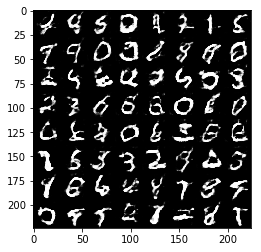

Epoch 2/2... Discriminator Loss: 0.7697... Generator Loss: 1.2942
Epoch 2/2... Discriminator Loss: 0.6626... Generator Loss: 1.6249
Epoch 2/2... Discriminator Loss: 0.8389... Generator Loss: 1.1231
Epoch 2/2... Discriminator Loss: 0.5949... Generator Loss: 1.7612
Epoch 2/2... Discriminator Loss: 1.1651... Generator Loss: 0.7103
Epoch 2/2... Discriminator Loss: 1.0417... Generator Loss: 3.5645
Epoch 2/2... Discriminator Loss: 0.7722... Generator Loss: 2.0481
Epoch 2/2... Discriminator Loss: 0.6997... Generator Loss: 2.0106
Epoch 2/2... Discriminator Loss: 0.6514... Generator Loss: 1.7163
Epoch 2/2... Discriminator Loss: 0.8206... Generator Loss: 1.1352


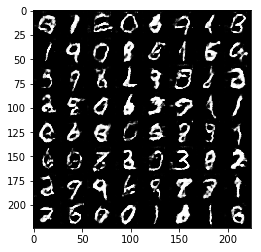

Epoch 2/2... Discriminator Loss: 1.1526... Generator Loss: 0.7089
Epoch 2/2... Discriminator Loss: 0.8046... Generator Loss: 1.1274
Epoch 2/2... Discriminator Loss: 0.6866... Generator Loss: 1.6190
Epoch 2/2... Discriminator Loss: 0.9521... Generator Loss: 0.9279
Epoch 2/2... Discriminator Loss: 0.5822... Generator Loss: 1.8885
Epoch 2/2... Discriminator Loss: 1.4064... Generator Loss: 3.4295
Epoch 2/2... Discriminator Loss: 1.0158... Generator Loss: 0.9375
Epoch 2/2... Discriminator Loss: 0.8207... Generator Loss: 1.4595
Epoch 2/2... Discriminator Loss: 1.2829... Generator Loss: 0.6232
Epoch 2/2... Discriminator Loss: 0.8526... Generator Loss: 1.0757


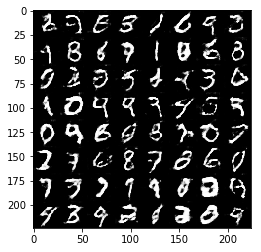

Epoch 2/2... Discriminator Loss: 0.7262... Generator Loss: 1.3029
Epoch 2/2... Discriminator Loss: 0.7810... Generator Loss: 2.6046
Epoch 2/2... Discriminator Loss: 0.6852... Generator Loss: 1.4132
Epoch 2/2... Discriminator Loss: 0.6232... Generator Loss: 1.6708
Epoch 2/2... Discriminator Loss: 1.0529... Generator Loss: 0.7894
Epoch 2/2... Discriminator Loss: 1.1039... Generator Loss: 0.8498
Epoch 2/2... Discriminator Loss: 0.6545... Generator Loss: 1.7223
Epoch 2/2... Discriminator Loss: 0.7293... Generator Loss: 1.3049
Epoch 2/2... Discriminator Loss: 1.5753... Generator Loss: 0.4706
Epoch 2/2... Discriminator Loss: 0.7437... Generator Loss: 1.6528


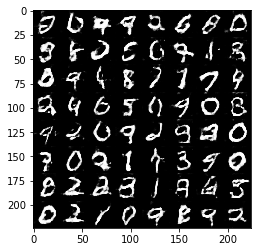

Epoch 2/2... Discriminator Loss: 0.6023... Generator Loss: 1.7128
Epoch 2/2... Discriminator Loss: 0.6583... Generator Loss: 1.4953
Epoch 2/2... Discriminator Loss: 0.7801... Generator Loss: 2.6382
Epoch 2/2... Discriminator Loss: 0.6319... Generator Loss: 1.8715
Epoch 2/2... Discriminator Loss: 0.7139... Generator Loss: 1.4266
Epoch 2/2... Discriminator Loss: 0.7101... Generator Loss: 1.3427
Epoch 2/2... Discriminator Loss: 0.6855... Generator Loss: 1.3698
Epoch 2/2... Discriminator Loss: 0.5495... Generator Loss: 2.1045
Epoch 2/2... Discriminator Loss: 0.7376... Generator Loss: 1.3185
Epoch 2/2... Discriminator Loss: 0.6839... Generator Loss: 1.3715


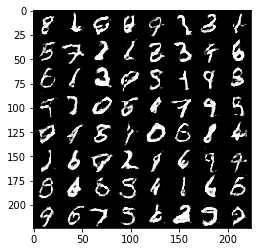

Epoch 2/2... Discriminator Loss: 2.3113... Generator Loss: 0.2667
Epoch 2/2... Discriminator Loss: 0.6243... Generator Loss: 1.6946
Epoch 2/2... Discriminator Loss: 0.6374... Generator Loss: 2.1449
Epoch 2/2... Discriminator Loss: 1.0590... Generator Loss: 0.8423
Epoch 2/2... Discriminator Loss: 0.7081... Generator Loss: 1.3501
Epoch 2/2... Discriminator Loss: 0.6034... Generator Loss: 1.9555
Epoch 2/2... Discriminator Loss: 1.4695... Generator Loss: 0.5652
Epoch 2/2... Discriminator Loss: 0.8382... Generator Loss: 2.1860
Epoch 2/2... Discriminator Loss: 0.6190... Generator Loss: 2.9478
Epoch 2/2... Discriminator Loss: 0.7577... Generator Loss: 1.2368


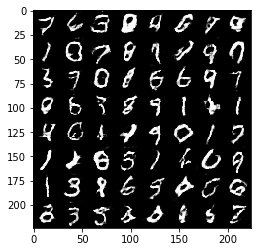

Epoch 2/2... Discriminator Loss: 0.7733... Generator Loss: 1.2531
Epoch 2/2... Discriminator Loss: 0.7109... Generator Loss: 1.3370
Epoch 2/2... Discriminator Loss: 0.6402... Generator Loss: 1.5165
Epoch 2/2... Discriminator Loss: 0.7081... Generator Loss: 1.4918
Epoch 2/2... Discriminator Loss: 0.7088... Generator Loss: 1.3657
Epoch 2/2... Discriminator Loss: 0.6622... Generator Loss: 1.6638
Epoch 2/2... Discriminator Loss: 1.2622... Generator Loss: 0.6295
Epoch 2/2... Discriminator Loss: 0.6033... Generator Loss: 1.6103
Epoch 2/2... Discriminator Loss: 0.6089... Generator Loss: 1.6311
Epoch 2/2... Discriminator Loss: 0.8607... Generator Loss: 1.1311


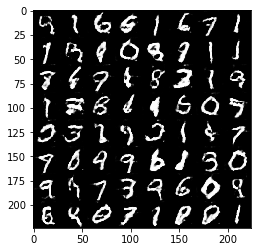

Epoch 2/2... Discriminator Loss: 1.4359... Generator Loss: 0.5733
Epoch 2/2... Discriminator Loss: 0.5486... Generator Loss: 2.0780
Epoch 2/2... Discriminator Loss: 0.8305... Generator Loss: 2.8560
Epoch 2/2... Discriminator Loss: 0.5861... Generator Loss: 1.8360
Epoch 2/2... Discriminator Loss: 0.9610... Generator Loss: 0.8643
Epoch 2/2... Discriminator Loss: 0.6862... Generator Loss: 1.3885
Epoch 2/2... Discriminator Loss: 0.8404... Generator Loss: 1.0804
Epoch 2/2... Discriminator Loss: 0.9147... Generator Loss: 1.0571
Epoch 2/2... Discriminator Loss: 0.8874... Generator Loss: 1.0476
Epoch 2/2... Discriminator Loss: 0.7860... Generator Loss: 1.1735


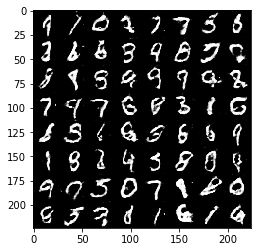

Epoch 2/2... Discriminator Loss: 1.7686... Generator Loss: 0.4310
Epoch 2/2... Discriminator Loss: 0.5150... Generator Loss: 2.2592
Epoch 2/2... Discriminator Loss: 0.7149... Generator Loss: 1.3828
Epoch 2/2... Discriminator Loss: 0.5247... Generator Loss: 2.2438
Epoch 2/2... Discriminator Loss: 0.6779... Generator Loss: 1.4427
Epoch 2/2... Discriminator Loss: 0.7642... Generator Loss: 1.3180
Epoch 2/2... Discriminator Loss: 0.5731... Generator Loss: 1.7960
Epoch 2/2... Discriminator Loss: 0.8577... Generator Loss: 1.0116
Epoch 2/2... Discriminator Loss: 0.9379... Generator Loss: 1.0146
Epoch 2/2... Discriminator Loss: 0.9527... Generator Loss: 1.5425


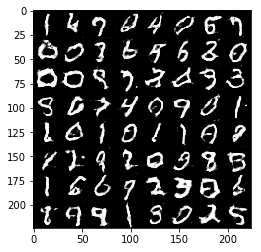

Epoch 2/2... Discriminator Loss: 0.7573... Generator Loss: 1.5407
Epoch 2/2... Discriminator Loss: 0.6912... Generator Loss: 1.7157
Epoch 2/2... Discriminator Loss: 1.1385... Generator Loss: 0.8111
Epoch 2/2... Discriminator Loss: 1.0924... Generator Loss: 0.7412
Epoch 2/2... Discriminator Loss: 0.7464... Generator Loss: 1.2840
Epoch 2/2... Discriminator Loss: 0.6310... Generator Loss: 1.7105
Epoch 2/2... Discriminator Loss: 0.8526... Generator Loss: 1.0986
Epoch 2/2... Discriminator Loss: 0.7745... Generator Loss: 1.2276
Epoch 2/2... Discriminator Loss: 0.7565... Generator Loss: 1.4081
Epoch 2/2... Discriminator Loss: 0.7963... Generator Loss: 2.8635


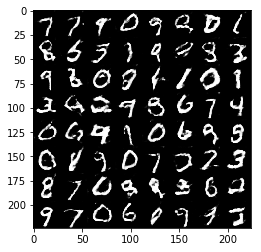

Epoch 2/2... Discriminator Loss: 0.6794... Generator Loss: 1.5529
Epoch 2/2... Discriminator Loss: 0.6766... Generator Loss: 1.9789
Epoch 2/2... Discriminator Loss: 1.1467... Generator Loss: 0.9324
Epoch 2/2... Discriminator Loss: 1.1947... Generator Loss: 0.6790
Epoch 2/2... Discriminator Loss: 0.8963... Generator Loss: 0.9912
Epoch 2/2... Discriminator Loss: 0.7462... Generator Loss: 1.4541
Epoch 2/2... Discriminator Loss: 0.7855... Generator Loss: 1.1443
Epoch 2/2... Discriminator Loss: 1.1283... Generator Loss: 3.1924
Epoch 2/2... Discriminator Loss: 0.5763... Generator Loss: 2.3324
Epoch 2/2... Discriminator Loss: 1.1606... Generator Loss: 0.7333


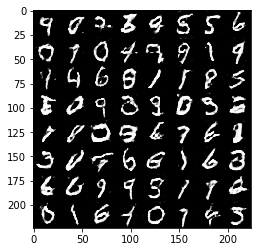

Epoch 2/2... Discriminator Loss: 0.8167... Generator Loss: 1.1738
Epoch 2/2... Discriminator Loss: 0.7252... Generator Loss: 1.3603
Epoch 2/2... Discriminator Loss: 0.6557... Generator Loss: 1.5450
Epoch 2/2... Discriminator Loss: 0.6633... Generator Loss: 1.7018
Epoch 2/2... Discriminator Loss: 1.0678... Generator Loss: 2.7909
Epoch 2/2... Discriminator Loss: 0.6784... Generator Loss: 1.5012
Epoch 2/2... Discriminator Loss: 0.6672... Generator Loss: 1.6222
Epoch 2/2... Discriminator Loss: 0.7692... Generator Loss: 3.1538
Epoch 2/2... Discriminator Loss: 0.6107... Generator Loss: 1.7279
Epoch 2/2... Discriminator Loss: 0.7286... Generator Loss: 1.3321


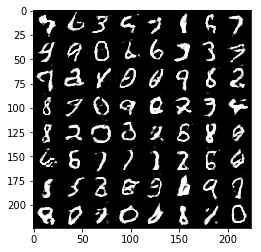

Epoch 2/2... Discriminator Loss: 0.8187... Generator Loss: 1.0959
Epoch 2/2... Discriminator Loss: 0.5777... Generator Loss: 1.8773
Epoch 2/2... Discriminator Loss: 0.6292... Generator Loss: 1.5723
Epoch 2/2... Discriminator Loss: 0.5768... Generator Loss: 2.1445
Epoch 2/2... Discriminator Loss: 0.6375... Generator Loss: 1.5721
Epoch 2/2... Discriminator Loss: 0.8398... Generator Loss: 1.2092
Epoch 2/2... Discriminator Loss: 0.6477... Generator Loss: 1.5694
Epoch 2/2... Discriminator Loss: 0.5232... Generator Loss: 2.3170
Epoch 2/2... Discriminator Loss: 0.9250... Generator Loss: 1.0176
Epoch 2/2... Discriminator Loss: 0.5159... Generator Loss: 2.5325


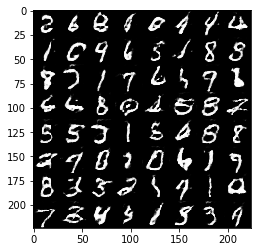

In [15]:
batch_size = 40
z_dim = 100
learning_rate = 0.0003
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2
mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.4577... Generator Loss: 3.6502
Epoch 1/1... Discriminator Loss: 1.8425... Generator Loss: 13.9177
Epoch 1/1... Discriminator Loss: 0.4613... Generator Loss: 11.4560
Epoch 1/1... Discriminator Loss: 0.4798... Generator Loss: 7.3345
Epoch 1/1... Discriminator Loss: 1.0958... Generator Loss: 9.1928
Epoch 1/1... Discriminator Loss: 0.8255... Generator Loss: 5.1458
Epoch 1/1... Discriminator Loss: 0.5447... Generator Loss: 2.4840
Epoch 1/1... Discriminator Loss: 0.5152... Generator Loss: 2.6430
Epoch 1/1... Discriminator Loss: 0.6602... Generator Loss: 1.6825
Epoch 1/1... Discriminator Loss: 0.4765... Generator Loss: 2.7803


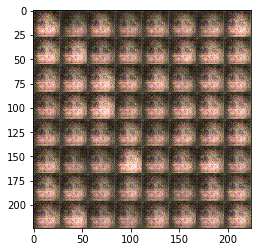

Epoch 1/1... Discriminator Loss: 0.4673... Generator Loss: 5.3204
Epoch 1/1... Discriminator Loss: 0.6647... Generator Loss: 2.3733
Epoch 1/1... Discriminator Loss: 0.6864... Generator Loss: 2.7003
Epoch 1/1... Discriminator Loss: 0.6296... Generator Loss: 1.7204
Epoch 1/1... Discriminator Loss: 0.5440... Generator Loss: 3.3252
Epoch 1/1... Discriminator Loss: 0.5919... Generator Loss: 2.0617
Epoch 1/1... Discriminator Loss: 0.5754... Generator Loss: 2.2078
Epoch 1/1... Discriminator Loss: 1.2652... Generator Loss: 0.9034
Epoch 1/1... Discriminator Loss: 1.5489... Generator Loss: 0.4895
Epoch 1/1... Discriminator Loss: 0.6698... Generator Loss: 3.2368


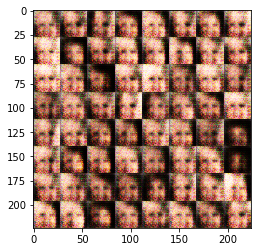

Epoch 1/1... Discriminator Loss: 0.9414... Generator Loss: 0.9999
Epoch 1/1... Discriminator Loss: 0.5782... Generator Loss: 2.3020
Epoch 1/1... Discriminator Loss: 0.6113... Generator Loss: 2.1303
Epoch 1/1... Discriminator Loss: 0.5542... Generator Loss: 2.3043
Epoch 1/1... Discriminator Loss: 0.5737... Generator Loss: 2.6118
Epoch 1/1... Discriminator Loss: 0.7508... Generator Loss: 3.6284
Epoch 1/1... Discriminator Loss: 0.5967... Generator Loss: 1.8283
Epoch 1/1... Discriminator Loss: 0.7662... Generator Loss: 2.3285
Epoch 1/1... Discriminator Loss: 0.5731... Generator Loss: 2.6814
Epoch 1/1... Discriminator Loss: 1.0531... Generator Loss: 0.9712


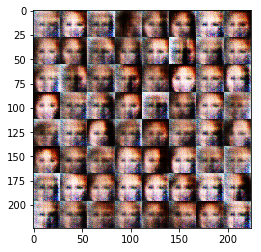

Epoch 1/1... Discriminator Loss: 1.1816... Generator Loss: 4.3046
Epoch 1/1... Discriminator Loss: 0.9433... Generator Loss: 2.4318
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.5572
Epoch 1/1... Discriminator Loss: 0.8386... Generator Loss: 2.2852
Epoch 1/1... Discriminator Loss: 1.0915... Generator Loss: 2.9197
Epoch 1/1... Discriminator Loss: 0.8522... Generator Loss: 1.5143
Epoch 1/1... Discriminator Loss: 0.8386... Generator Loss: 1.6091
Epoch 1/1... Discriminator Loss: 0.6341... Generator Loss: 2.5154
Epoch 1/1... Discriminator Loss: 0.7821... Generator Loss: 1.4121
Epoch 1/1... Discriminator Loss: 0.6434... Generator Loss: 1.7147


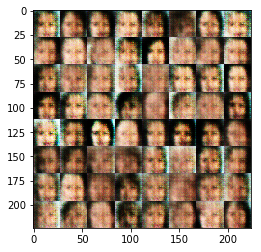

Epoch 1/1... Discriminator Loss: 0.6601... Generator Loss: 1.6805
Epoch 1/1... Discriminator Loss: 0.7697... Generator Loss: 4.1037
Epoch 1/1... Discriminator Loss: 0.6066... Generator Loss: 4.0533
Epoch 1/1... Discriminator Loss: 0.6503... Generator Loss: 1.8783
Epoch 1/1... Discriminator Loss: 0.8715... Generator Loss: 1.4086
Epoch 1/1... Discriminator Loss: 0.7518... Generator Loss: 1.8598
Epoch 1/1... Discriminator Loss: 0.6121... Generator Loss: 2.3204
Epoch 1/1... Discriminator Loss: 0.7911... Generator Loss: 1.2219
Epoch 1/1... Discriminator Loss: 0.8410... Generator Loss: 1.3869
Epoch 1/1... Discriminator Loss: 0.6601... Generator Loss: 1.6416


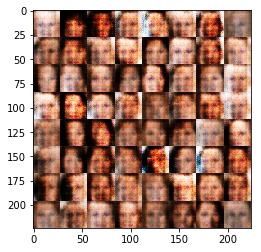

Epoch 1/1... Discriminator Loss: 0.6091... Generator Loss: 1.9924
Epoch 1/1... Discriminator Loss: 0.6152... Generator Loss: 2.3198
Epoch 1/1... Discriminator Loss: 0.7527... Generator Loss: 1.5976
Epoch 1/1... Discriminator Loss: 1.6523... Generator Loss: 0.4258
Epoch 1/1... Discriminator Loss: 0.9851... Generator Loss: 1.0514
Epoch 1/1... Discriminator Loss: 0.7994... Generator Loss: 2.0572
Epoch 1/1... Discriminator Loss: 0.6021... Generator Loss: 2.2938
Epoch 1/1... Discriminator Loss: 0.5231... Generator Loss: 2.5766
Epoch 1/1... Discriminator Loss: 0.6012... Generator Loss: 3.1939
Epoch 1/1... Discriminator Loss: 0.5223... Generator Loss: 2.9024


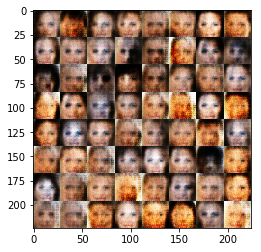

Epoch 1/1... Discriminator Loss: 0.8242... Generator Loss: 3.0850
Epoch 1/1... Discriminator Loss: 0.6984... Generator Loss: 2.0868
Epoch 1/1... Discriminator Loss: 0.7749... Generator Loss: 2.4578
Epoch 1/1... Discriminator Loss: 1.1861... Generator Loss: 0.8865
Epoch 1/1... Discriminator Loss: 0.7514... Generator Loss: 2.5170
Epoch 1/1... Discriminator Loss: 0.8103... Generator Loss: 1.4994
Epoch 1/1... Discriminator Loss: 0.6794... Generator Loss: 2.2231
Epoch 1/1... Discriminator Loss: 0.7346... Generator Loss: 1.5290
Epoch 1/1... Discriminator Loss: 1.0555... Generator Loss: 2.6528
Epoch 1/1... Discriminator Loss: 0.7671... Generator Loss: 1.8308


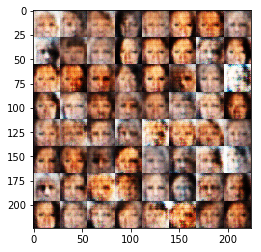

Epoch 1/1... Discriminator Loss: 1.1752... Generator Loss: 2.6288
Epoch 1/1... Discriminator Loss: 0.8085... Generator Loss: 1.6997
Epoch 1/1... Discriminator Loss: 1.0266... Generator Loss: 1.1402
Epoch 1/1... Discriminator Loss: 0.8358... Generator Loss: 1.9405
Epoch 1/1... Discriminator Loss: 0.9677... Generator Loss: 1.0670
Epoch 1/1... Discriminator Loss: 0.6585... Generator Loss: 1.7945
Epoch 1/1... Discriminator Loss: 0.8477... Generator Loss: 1.2166
Epoch 1/1... Discriminator Loss: 0.9733... Generator Loss: 1.8286
Epoch 1/1... Discriminator Loss: 0.7652... Generator Loss: 2.0700
Epoch 1/1... Discriminator Loss: 0.7469... Generator Loss: 1.8128


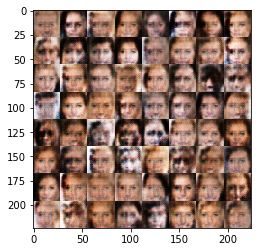

Epoch 1/1... Discriminator Loss: 0.8603... Generator Loss: 1.1700
Epoch 1/1... Discriminator Loss: 0.8342... Generator Loss: 1.5457
Epoch 1/1... Discriminator Loss: 0.8979... Generator Loss: 1.6682
Epoch 1/1... Discriminator Loss: 0.8113... Generator Loss: 2.0649
Epoch 1/1... Discriminator Loss: 0.8482... Generator Loss: 1.2278
Epoch 1/1... Discriminator Loss: 0.7962... Generator Loss: 1.5308
Epoch 1/1... Discriminator Loss: 1.0369... Generator Loss: 1.0355
Epoch 1/1... Discriminator Loss: 1.0032... Generator Loss: 0.9244
Epoch 1/1... Discriminator Loss: 0.9035... Generator Loss: 1.8099
Epoch 1/1... Discriminator Loss: 0.7926... Generator Loss: 1.4312


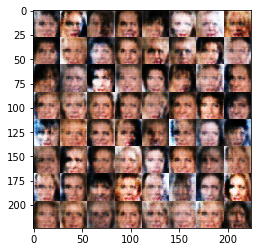

Epoch 1/1... Discriminator Loss: 0.7942... Generator Loss: 1.9058
Epoch 1/1... Discriminator Loss: 0.9044... Generator Loss: 1.2425
Epoch 1/1... Discriminator Loss: 0.9599... Generator Loss: 1.0601
Epoch 1/1... Discriminator Loss: 0.7651... Generator Loss: 1.4294
Epoch 1/1... Discriminator Loss: 0.8584... Generator Loss: 1.2102
Epoch 1/1... Discriminator Loss: 0.7515... Generator Loss: 1.5311
Epoch 1/1... Discriminator Loss: 0.8370... Generator Loss: 1.2094
Epoch 1/1... Discriminator Loss: 1.0680... Generator Loss: 0.8275
Epoch 1/1... Discriminator Loss: 0.8700... Generator Loss: 1.8825
Epoch 1/1... Discriminator Loss: 0.7895... Generator Loss: 1.4586


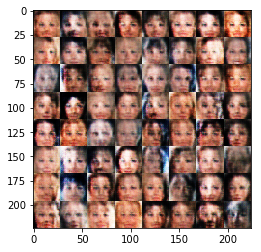

Epoch 1/1... Discriminator Loss: 0.7838... Generator Loss: 1.5261
Epoch 1/1... Discriminator Loss: 1.4839... Generator Loss: 0.5235
Epoch 1/1... Discriminator Loss: 0.7439... Generator Loss: 1.7068
Epoch 1/1... Discriminator Loss: 1.0806... Generator Loss: 1.0071
Epoch 1/1... Discriminator Loss: 1.0347... Generator Loss: 0.8572
Epoch 1/1... Discriminator Loss: 0.7632... Generator Loss: 1.9906
Epoch 1/1... Discriminator Loss: 0.7102... Generator Loss: 2.2564
Epoch 1/1... Discriminator Loss: 0.8615... Generator Loss: 1.2634
Epoch 1/1... Discriminator Loss: 0.7169... Generator Loss: 1.9532
Epoch 1/1... Discriminator Loss: 1.3647... Generator Loss: 0.5485


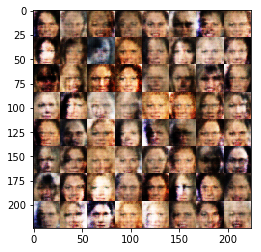

Epoch 1/1... Discriminator Loss: 0.8530... Generator Loss: 1.5856
Epoch 1/1... Discriminator Loss: 1.0173... Generator Loss: 2.4272
Epoch 1/1... Discriminator Loss: 0.6270... Generator Loss: 2.3533
Epoch 1/1... Discriminator Loss: 0.8939... Generator Loss: 1.6151
Epoch 1/1... Discriminator Loss: 0.6624... Generator Loss: 1.6175
Epoch 1/1... Discriminator Loss: 0.8047... Generator Loss: 1.5557
Epoch 1/1... Discriminator Loss: 0.7973... Generator Loss: 2.8358
Epoch 1/1... Discriminator Loss: 0.8560... Generator Loss: 1.7148
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.5543
Epoch 1/1... Discriminator Loss: 0.8244... Generator Loss: 1.2520


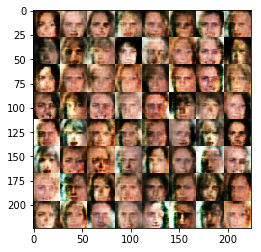

Epoch 1/1... Discriminator Loss: 0.7400... Generator Loss: 2.2549
Epoch 1/1... Discriminator Loss: 0.6945... Generator Loss: 1.8600
Epoch 1/1... Discriminator Loss: 0.9657... Generator Loss: 1.1379
Epoch 1/1... Discriminator Loss: 0.7592... Generator Loss: 1.5251
Epoch 1/1... Discriminator Loss: 0.7401... Generator Loss: 1.4903
Epoch 1/1... Discriminator Loss: 1.1161... Generator Loss: 0.8845
Epoch 1/1... Discriminator Loss: 0.7966... Generator Loss: 2.4510
Epoch 1/1... Discriminator Loss: 0.8392... Generator Loss: 1.6534
Epoch 1/1... Discriminator Loss: 0.9641... Generator Loss: 1.0205
Epoch 1/1... Discriminator Loss: 1.1643... Generator Loss: 0.7206


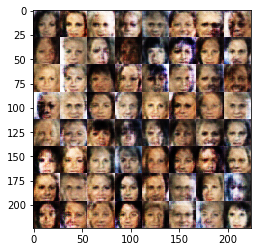

Epoch 1/1... Discriminator Loss: 0.6535... Generator Loss: 1.8507
Epoch 1/1... Discriminator Loss: 0.7915... Generator Loss: 1.4185
Epoch 1/1... Discriminator Loss: 0.8520... Generator Loss: 2.3659
Epoch 1/1... Discriminator Loss: 0.7215... Generator Loss: 2.4385
Epoch 1/1... Discriminator Loss: 0.8897... Generator Loss: 1.0997
Epoch 1/1... Discriminator Loss: 0.7647... Generator Loss: 2.6317
Epoch 1/1... Discriminator Loss: 0.7042... Generator Loss: 1.9415
Epoch 1/1... Discriminator Loss: 0.8712... Generator Loss: 1.2054
Epoch 1/1... Discriminator Loss: 0.9353... Generator Loss: 1.0089
Epoch 1/1... Discriminator Loss: 0.9857... Generator Loss: 0.9512


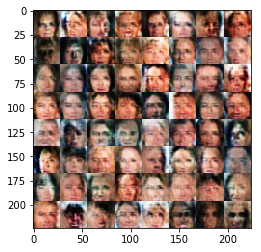

Epoch 1/1... Discriminator Loss: 0.9637... Generator Loss: 0.9791
Epoch 1/1... Discriminator Loss: 0.7632... Generator Loss: 2.2103
Epoch 1/1... Discriminator Loss: 0.7810... Generator Loss: 1.6222
Epoch 1/1... Discriminator Loss: 1.0180... Generator Loss: 0.8376
Epoch 1/1... Discriminator Loss: 0.8073... Generator Loss: 1.6412
Epoch 1/1... Discriminator Loss: 0.7912... Generator Loss: 1.2506
Epoch 1/1... Discriminator Loss: 0.9362... Generator Loss: 0.9469
Epoch 1/1... Discriminator Loss: 0.7077... Generator Loss: 1.6323
Epoch 1/1... Discriminator Loss: 1.1463... Generator Loss: 0.7819
Epoch 1/1... Discriminator Loss: 0.7435... Generator Loss: 1.3591


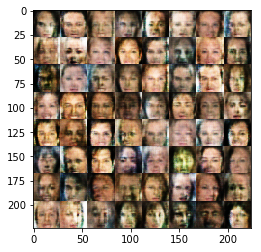

Epoch 1/1... Discriminator Loss: 0.9297... Generator Loss: 0.9564
Epoch 1/1... Discriminator Loss: 1.2428... Generator Loss: 2.7652
Epoch 1/1... Discriminator Loss: 1.3643... Generator Loss: 3.0100
Epoch 1/1... Discriminator Loss: 0.7780... Generator Loss: 1.3812
Epoch 1/1... Discriminator Loss: 1.1567... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 0.7033... Generator Loss: 1.8647
Epoch 1/1... Discriminator Loss: 0.6851... Generator Loss: 1.8369
Epoch 1/1... Discriminator Loss: 0.8448... Generator Loss: 2.4353
Epoch 1/1... Discriminator Loss: 0.9021... Generator Loss: 1.0831
Epoch 1/1... Discriminator Loss: 0.7674... Generator Loss: 1.4611


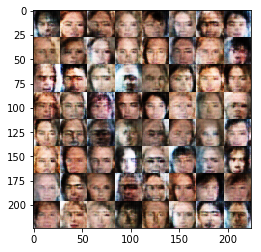

Epoch 1/1... Discriminator Loss: 0.8605... Generator Loss: 1.1064
Epoch 1/1... Discriminator Loss: 1.2476... Generator Loss: 0.6485
Epoch 1/1... Discriminator Loss: 0.7557... Generator Loss: 1.7618
Epoch 1/1... Discriminator Loss: 0.8339... Generator Loss: 1.3288
Epoch 1/1... Discriminator Loss: 0.9496... Generator Loss: 1.0557
Epoch 1/1... Discriminator Loss: 0.7848... Generator Loss: 1.4565
Epoch 1/1... Discriminator Loss: 0.8453... Generator Loss: 2.3090
Epoch 1/1... Discriminator Loss: 0.7676... Generator Loss: 1.7095
Epoch 1/1... Discriminator Loss: 0.7177... Generator Loss: 1.9860
Epoch 1/1... Discriminator Loss: 0.8253... Generator Loss: 1.4509


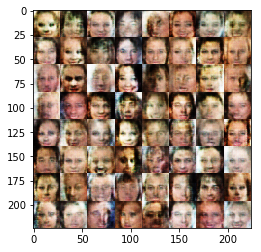

Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 0.7861
Epoch 1/1... Discriminator Loss: 0.8872... Generator Loss: 2.4305
Epoch 1/1... Discriminator Loss: 1.1446... Generator Loss: 0.7386
Epoch 1/1... Discriminator Loss: 0.8364... Generator Loss: 1.6529
Epoch 1/1... Discriminator Loss: 0.8036... Generator Loss: 2.0644
Epoch 1/1... Discriminator Loss: 0.6950... Generator Loss: 1.8574
Epoch 1/1... Discriminator Loss: 0.7622... Generator Loss: 1.5838
Epoch 1/1... Discriminator Loss: 0.8714... Generator Loss: 1.1845
Epoch 1/1... Discriminator Loss: 1.0439... Generator Loss: 0.8179
Epoch 1/1... Discriminator Loss: 1.0075... Generator Loss: 1.5835


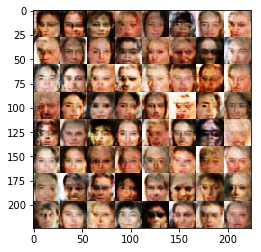

Epoch 1/1... Discriminator Loss: 0.6983... Generator Loss: 1.6618
Epoch 1/1... Discriminator Loss: 0.9843... Generator Loss: 1.0571
Epoch 1/1... Discriminator Loss: 0.7620... Generator Loss: 1.5711
Epoch 1/1... Discriminator Loss: 0.7897... Generator Loss: 1.4498
Epoch 1/1... Discriminator Loss: 0.9837... Generator Loss: 0.8793
Epoch 1/1... Discriminator Loss: 0.6733... Generator Loss: 2.0024
Epoch 1/1... Discriminator Loss: 1.2405... Generator Loss: 2.7485
Epoch 1/1... Discriminator Loss: 0.7908... Generator Loss: 1.2522
Epoch 1/1... Discriminator Loss: 0.9178... Generator Loss: 1.7041
Epoch 1/1... Discriminator Loss: 0.9547... Generator Loss: 1.0679


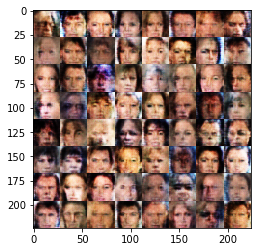

Epoch 1/1... Discriminator Loss: 1.1595... Generator Loss: 2.6379
Epoch 1/1... Discriminator Loss: 0.9442... Generator Loss: 1.0842
Epoch 1/1... Discriminator Loss: 1.2625... Generator Loss: 0.5902
Epoch 1/1... Discriminator Loss: 0.9512... Generator Loss: 0.9603
Epoch 1/1... Discriminator Loss: 0.8779... Generator Loss: 1.9142
Epoch 1/1... Discriminator Loss: 0.8786... Generator Loss: 1.7478
Epoch 1/1... Discriminator Loss: 0.7859... Generator Loss: 1.3382
Epoch 1/1... Discriminator Loss: 0.7396... Generator Loss: 2.2675
Epoch 1/1... Discriminator Loss: 0.9296... Generator Loss: 1.4767
Epoch 1/1... Discriminator Loss: 1.7304... Generator Loss: 0.4783


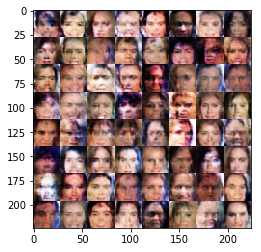

Epoch 1/1... Discriminator Loss: 1.6072... Generator Loss: 0.4386
Epoch 1/1... Discriminator Loss: 0.8135... Generator Loss: 1.9039
Epoch 1/1... Discriminator Loss: 0.9479... Generator Loss: 1.1067
Epoch 1/1... Discriminator Loss: 0.6579... Generator Loss: 1.7507
Epoch 1/1... Discriminator Loss: 0.7269... Generator Loss: 1.5383
Epoch 1/1... Discriminator Loss: 0.8752... Generator Loss: 2.3014
Epoch 1/1... Discriminator Loss: 0.9973... Generator Loss: 0.8720
Epoch 1/1... Discriminator Loss: 0.8498... Generator Loss: 1.2448
Epoch 1/1... Discriminator Loss: 0.7957... Generator Loss: 1.4200
Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 0.7627


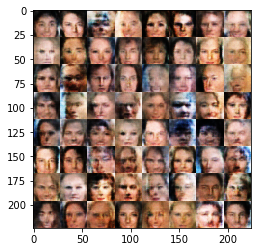

Epoch 1/1... Discriminator Loss: 0.8300... Generator Loss: 1.7714
Epoch 1/1... Discriminator Loss: 0.8253... Generator Loss: 1.3821
Epoch 1/1... Discriminator Loss: 1.2537... Generator Loss: 0.6249
Epoch 1/1... Discriminator Loss: 0.7944... Generator Loss: 1.5121
Epoch 1/1... Discriminator Loss: 0.7707... Generator Loss: 1.8505
Epoch 1/1... Discriminator Loss: 0.7650... Generator Loss: 1.3539
Epoch 1/1... Discriminator Loss: 0.7740... Generator Loss: 1.8580
Epoch 1/1... Discriminator Loss: 1.0049... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 0.7408... Generator Loss: 2.4122
Epoch 1/1... Discriminator Loss: 1.0144... Generator Loss: 0.8769


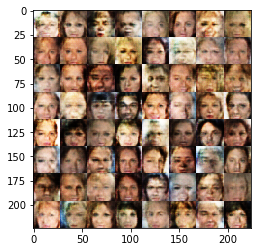

Epoch 1/1... Discriminator Loss: 0.9947... Generator Loss: 0.8802
Epoch 1/1... Discriminator Loss: 0.7899... Generator Loss: 1.3743
Epoch 1/1... Discriminator Loss: 0.6787... Generator Loss: 1.9175
Epoch 1/1... Discriminator Loss: 0.8502... Generator Loss: 1.2051
Epoch 1/1... Discriminator Loss: 0.7190... Generator Loss: 2.2825
Epoch 1/1... Discriminator Loss: 1.1138... Generator Loss: 0.7514
Epoch 1/1... Discriminator Loss: 0.9822... Generator Loss: 0.8845
Epoch 1/1... Discriminator Loss: 0.6720... Generator Loss: 1.5071
Epoch 1/1... Discriminator Loss: 0.8048... Generator Loss: 1.2206
Epoch 1/1... Discriminator Loss: 1.0065... Generator Loss: 0.9423


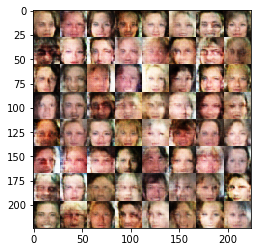

Epoch 1/1... Discriminator Loss: 0.9737... Generator Loss: 1.3485
Epoch 1/1... Discriminator Loss: 0.9149... Generator Loss: 1.0332
Epoch 1/1... Discriminator Loss: 0.9756... Generator Loss: 1.1105
Epoch 1/1... Discriminator Loss: 0.6771... Generator Loss: 2.2787
Epoch 1/1... Discriminator Loss: 0.9596... Generator Loss: 1.0614
Epoch 1/1... Discriminator Loss: 0.9010... Generator Loss: 1.3071
Epoch 1/1... Discriminator Loss: 0.9222... Generator Loss: 1.1511
Epoch 1/1... Discriminator Loss: 0.9242... Generator Loss: 1.0374
Epoch 1/1... Discriminator Loss: 0.8087... Generator Loss: 1.2685
Epoch 1/1... Discriminator Loss: 0.6734... Generator Loss: 1.9654


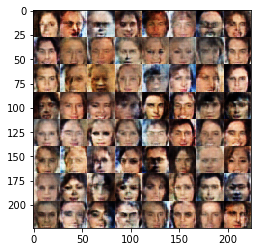

Epoch 1/1... Discriminator Loss: 0.8610... Generator Loss: 1.7056
Epoch 1/1... Discriminator Loss: 0.8146... Generator Loss: 1.3459
Epoch 1/1... Discriminator Loss: 0.9941... Generator Loss: 0.9816
Epoch 1/1... Discriminator Loss: 0.9128... Generator Loss: 1.1217
Epoch 1/1... Discriminator Loss: 0.9130... Generator Loss: 1.0987
Epoch 1/1... Discriminator Loss: 0.7213... Generator Loss: 1.7792
Epoch 1/1... Discriminator Loss: 0.7866... Generator Loss: 1.4142
Epoch 1/1... Discriminator Loss: 0.8649... Generator Loss: 1.2427
Epoch 1/1... Discriminator Loss: 0.9000... Generator Loss: 1.7360
Epoch 1/1... Discriminator Loss: 0.8034... Generator Loss: 1.3091


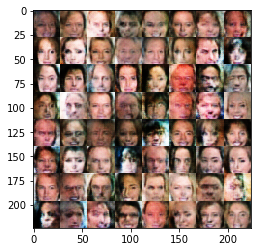

Epoch 1/1... Discriminator Loss: 0.6899... Generator Loss: 2.7558
Epoch 1/1... Discriminator Loss: 1.0406... Generator Loss: 0.8472
Epoch 1/1... Discriminator Loss: 0.8889... Generator Loss: 1.0236
Epoch 1/1... Discriminator Loss: 1.0767... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 1.7001... Generator Loss: 0.3819
Epoch 1/1... Discriminator Loss: 0.8574... Generator Loss: 1.1858
Epoch 1/1... Discriminator Loss: 0.7955... Generator Loss: 1.5179
Epoch 1/1... Discriminator Loss: 0.7915... Generator Loss: 1.2968
Epoch 1/1... Discriminator Loss: 0.7980... Generator Loss: 1.4049
Epoch 1/1... Discriminator Loss: 0.9391... Generator Loss: 2.3717


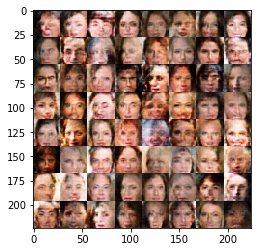

Epoch 1/1... Discriminator Loss: 0.9522... Generator Loss: 0.9775
Epoch 1/1... Discriminator Loss: 1.1052... Generator Loss: 0.7286
Epoch 1/1... Discriminator Loss: 0.6233... Generator Loss: 2.0224
Epoch 1/1... Discriminator Loss: 0.9196... Generator Loss: 2.3397
Epoch 1/1... Discriminator Loss: 0.7169... Generator Loss: 1.6397
Epoch 1/1... Discriminator Loss: 0.7651... Generator Loss: 1.3712
Epoch 1/1... Discriminator Loss: 0.7613... Generator Loss: 1.7117
Epoch 1/1... Discriminator Loss: 0.9275... Generator Loss: 1.4127
Epoch 1/1... Discriminator Loss: 0.8837... Generator Loss: 2.2551
Epoch 1/1... Discriminator Loss: 0.9275... Generator Loss: 1.3421


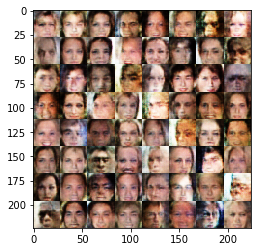

Epoch 1/1... Discriminator Loss: 0.8425... Generator Loss: 1.5054
Epoch 1/1... Discriminator Loss: 1.1256... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 0.7516... Generator Loss: 1.9034
Epoch 1/1... Discriminator Loss: 0.7905... Generator Loss: 1.2157
Epoch 1/1... Discriminator Loss: 1.2543... Generator Loss: 0.6393
Epoch 1/1... Discriminator Loss: 0.8156... Generator Loss: 1.3688
Epoch 1/1... Discriminator Loss: 1.0926... Generator Loss: 0.7926
Epoch 1/1... Discriminator Loss: 0.7581... Generator Loss: 1.7355
Epoch 1/1... Discriminator Loss: 0.7553... Generator Loss: 1.2873
Epoch 1/1... Discriminator Loss: 1.0274... Generator Loss: 0.8894


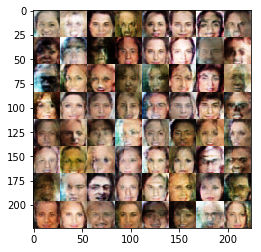

Epoch 1/1... Discriminator Loss: 0.6919... Generator Loss: 1.6186
Epoch 1/1... Discriminator Loss: 0.7972... Generator Loss: 1.3893
Epoch 1/1... Discriminator Loss: 0.6452... Generator Loss: 1.9549
Epoch 1/1... Discriminator Loss: 1.0254... Generator Loss: 0.8009
Epoch 1/1... Discriminator Loss: 0.8044... Generator Loss: 1.7931
Epoch 1/1... Discriminator Loss: 0.9030... Generator Loss: 1.1987
Epoch 1/1... Discriminator Loss: 0.8270... Generator Loss: 1.4882
Epoch 1/1... Discriminator Loss: 0.7053... Generator Loss: 1.9987
Epoch 1/1... Discriminator Loss: 0.9274... Generator Loss: 1.0213
Epoch 1/1... Discriminator Loss: 0.8485... Generator Loss: 1.7271


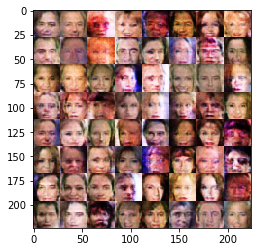

Epoch 1/1... Discriminator Loss: 0.8419... Generator Loss: 1.9595
Epoch 1/1... Discriminator Loss: 1.0797... Generator Loss: 0.7748
Epoch 1/1... Discriminator Loss: 0.8683... Generator Loss: 1.0330
Epoch 1/1... Discriminator Loss: 0.8326... Generator Loss: 1.5113
Epoch 1/1... Discriminator Loss: 1.0036... Generator Loss: 0.8742
Epoch 1/1... Discriminator Loss: 0.7783... Generator Loss: 1.3176
Epoch 1/1... Discriminator Loss: 0.8364... Generator Loss: 1.6487
Epoch 1/1... Discriminator Loss: 1.0730... Generator Loss: 0.8167
Epoch 1/1... Discriminator Loss: 0.6073... Generator Loss: 1.8077
Epoch 1/1... Discriminator Loss: 0.7106... Generator Loss: 1.8596


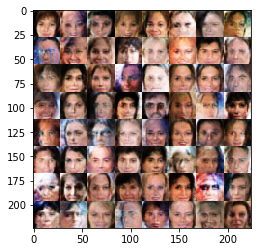

Epoch 1/1... Discriminator Loss: 0.6393... Generator Loss: 2.2835
Epoch 1/1... Discriminator Loss: 0.9636... Generator Loss: 1.1113
Epoch 1/1... Discriminator Loss: 0.7678... Generator Loss: 1.6305
Epoch 1/1... Discriminator Loss: 0.6097... Generator Loss: 1.8865
Epoch 1/1... Discriminator Loss: 0.8982... Generator Loss: 0.9452
Epoch 1/1... Discriminator Loss: 0.9223... Generator Loss: 1.0916
Epoch 1/1... Discriminator Loss: 0.9219... Generator Loss: 1.1580
Epoch 1/1... Discriminator Loss: 1.0693... Generator Loss: 0.7825
Epoch 1/1... Discriminator Loss: 0.6629... Generator Loss: 1.6725
Epoch 1/1... Discriminator Loss: 0.9143... Generator Loss: 1.2454


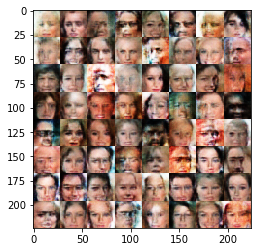

Epoch 1/1... Discriminator Loss: 0.9588... Generator Loss: 0.8836
Epoch 1/1... Discriminator Loss: 0.6824... Generator Loss: 1.4169
Epoch 1/1... Discriminator Loss: 0.9947... Generator Loss: 0.8646
Epoch 1/1... Discriminator Loss: 0.7022... Generator Loss: 1.6803
Epoch 1/1... Discriminator Loss: 0.8441... Generator Loss: 1.3272
Epoch 1/1... Discriminator Loss: 0.7133... Generator Loss: 1.4789
Epoch 1/1... Discriminator Loss: 0.6906... Generator Loss: 1.8609
Epoch 1/1... Discriminator Loss: 0.6532... Generator Loss: 1.7774
Epoch 1/1... Discriminator Loss: 0.8585... Generator Loss: 1.2369
Epoch 1/1... Discriminator Loss: 0.9940... Generator Loss: 0.8940


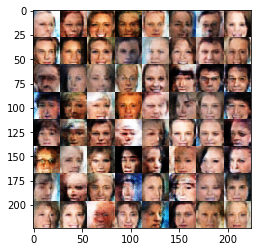

Epoch 1/1... Discriminator Loss: 0.8098... Generator Loss: 2.1656
Epoch 1/1... Discriminator Loss: 0.9184... Generator Loss: 1.2050
Epoch 1/1... Discriminator Loss: 0.8057... Generator Loss: 1.3774
Epoch 1/1... Discriminator Loss: 0.7004... Generator Loss: 1.6045
Epoch 1/1... Discriminator Loss: 0.7424... Generator Loss: 1.5599
Epoch 1/1... Discriminator Loss: 0.8294... Generator Loss: 1.2243
Epoch 1/1... Discriminator Loss: 0.9010... Generator Loss: 1.0697
Epoch 1/1... Discriminator Loss: 0.6757... Generator Loss: 2.4092
Epoch 1/1... Discriminator Loss: 0.5922... Generator Loss: 1.8134
Epoch 1/1... Discriminator Loss: 0.8876... Generator Loss: 1.1852


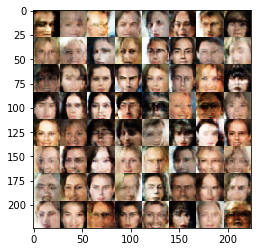

Epoch 1/1... Discriminator Loss: 0.9604... Generator Loss: 1.0897
Epoch 1/1... Discriminator Loss: 0.5996... Generator Loss: 1.9833
Epoch 1/1... Discriminator Loss: 0.7254... Generator Loss: 1.5202
Epoch 1/1... Discriminator Loss: 1.2044... Generator Loss: 0.6597
Epoch 1/1... Discriminator Loss: 1.1493... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 0.7761... Generator Loss: 1.4278
Epoch 1/1... Discriminator Loss: 0.6641... Generator Loss: 1.5614
Epoch 1/1... Discriminator Loss: 0.8901... Generator Loss: 1.3101
Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 0.6615
Epoch 1/1... Discriminator Loss: 0.7261... Generator Loss: 2.0147


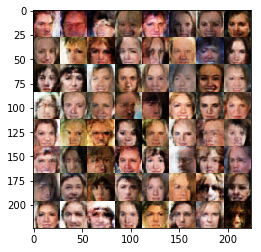

Epoch 1/1... Discriminator Loss: 0.9953... Generator Loss: 0.9298
Epoch 1/1... Discriminator Loss: 0.8414... Generator Loss: 1.4800
Epoch 1/1... Discriminator Loss: 0.8832... Generator Loss: 1.0935
Epoch 1/1... Discriminator Loss: 0.8728... Generator Loss: 1.7287
Epoch 1/1... Discriminator Loss: 0.9694... Generator Loss: 1.8919
Epoch 1/1... Discriminator Loss: 0.8167... Generator Loss: 1.3261
Epoch 1/1... Discriminator Loss: 1.1362... Generator Loss: 0.7715
Epoch 1/1... Discriminator Loss: 1.1512... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.1076... Generator Loss: 1.8841
Epoch 1/1... Discriminator Loss: 0.8653... Generator Loss: 1.0468


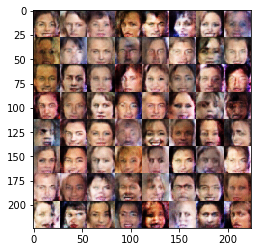

Epoch 1/1... Discriminator Loss: 0.8146... Generator Loss: 1.3251
Epoch 1/1... Discriminator Loss: 0.8159... Generator Loss: 1.3315
Epoch 1/1... Discriminator Loss: 1.1236... Generator Loss: 3.2341
Epoch 1/1... Discriminator Loss: 0.6869... Generator Loss: 1.5197
Epoch 1/1... Discriminator Loss: 0.7628... Generator Loss: 1.2638
Epoch 1/1... Discriminator Loss: 0.7875... Generator Loss: 1.2480
Epoch 1/1... Discriminator Loss: 0.8312... Generator Loss: 1.5730
Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.5804
Epoch 1/1... Discriminator Loss: 1.0021... Generator Loss: 0.8991
Epoch 1/1... Discriminator Loss: 1.0550... Generator Loss: 0.8522


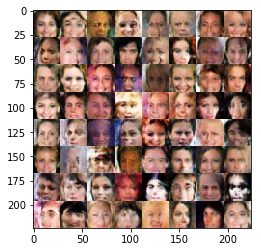

Epoch 1/1... Discriminator Loss: 1.1409... Generator Loss: 0.6713
Epoch 1/1... Discriminator Loss: 0.8471... Generator Loss: 1.1330
Epoch 1/1... Discriminator Loss: 0.9414... Generator Loss: 0.9895
Epoch 1/1... Discriminator Loss: 0.7914... Generator Loss: 1.2626
Epoch 1/1... Discriminator Loss: 0.7820... Generator Loss: 1.3223
Epoch 1/1... Discriminator Loss: 0.8899... Generator Loss: 1.0963
Epoch 1/1... Discriminator Loss: 0.6411... Generator Loss: 1.5891
Epoch 1/1... Discriminator Loss: 0.6995... Generator Loss: 1.4510
Epoch 1/1... Discriminator Loss: 0.5437... Generator Loss: 2.5436
Epoch 1/1... Discriminator Loss: 1.0851... Generator Loss: 0.8430


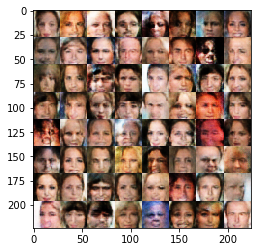

Epoch 1/1... Discriminator Loss: 0.8086... Generator Loss: 1.3459
Epoch 1/1... Discriminator Loss: 1.2030... Generator Loss: 0.6818
Epoch 1/1... Discriminator Loss: 0.8364... Generator Loss: 1.3816
Epoch 1/1... Discriminator Loss: 0.7988... Generator Loss: 1.2349
Epoch 1/1... Discriminator Loss: 1.0932... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 0.7819... Generator Loss: 1.4658
Epoch 1/1... Discriminator Loss: 0.7664... Generator Loss: 1.2575
Epoch 1/1... Discriminator Loss: 0.7288... Generator Loss: 1.3403
Epoch 1/1... Discriminator Loss: 1.2017... Generator Loss: 0.7109
Epoch 1/1... Discriminator Loss: 1.1078... Generator Loss: 0.7004


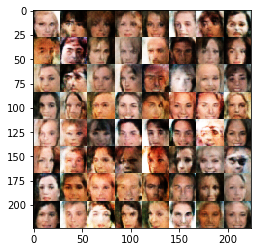

Epoch 1/1... Discriminator Loss: 0.8719... Generator Loss: 1.1441
Epoch 1/1... Discriminator Loss: 0.7691... Generator Loss: 1.2775
Epoch 1/1... Discriminator Loss: 1.1235... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 0.7351... Generator Loss: 1.4012
Epoch 1/1... Discriminator Loss: 1.1935... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 0.7007... Generator Loss: 1.6361
Epoch 1/1... Discriminator Loss: 0.7091... Generator Loss: 1.9690
Epoch 1/1... Discriminator Loss: 0.8628... Generator Loss: 1.1823
Epoch 1/1... Discriminator Loss: 1.9629... Generator Loss: 0.2798
Epoch 1/1... Discriminator Loss: 0.9540... Generator Loss: 1.3392


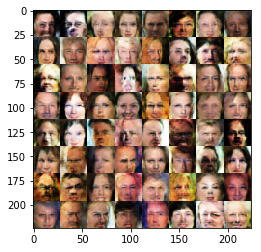

Epoch 1/1... Discriminator Loss: 0.9089... Generator Loss: 1.0803
Epoch 1/1... Discriminator Loss: 0.8642... Generator Loss: 1.1893
Epoch 1/1... Discriminator Loss: 0.8496... Generator Loss: 1.1613
Epoch 1/1... Discriminator Loss: 0.8490... Generator Loss: 1.2573
Epoch 1/1... Discriminator Loss: 0.5895... Generator Loss: 2.0132
Epoch 1/1... Discriminator Loss: 0.8332... Generator Loss: 1.7005
Epoch 1/1... Discriminator Loss: 0.7564... Generator Loss: 1.7395
Epoch 1/1... Discriminator Loss: 0.7559... Generator Loss: 1.4163
Epoch 1/1... Discriminator Loss: 0.8299... Generator Loss: 1.6347
Epoch 1/1... Discriminator Loss: 1.0429... Generator Loss: 1.6506


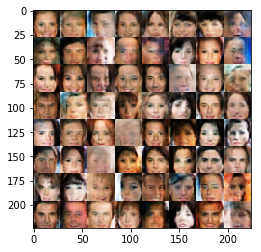

Epoch 1/1... Discriminator Loss: 0.8273... Generator Loss: 1.1180
Epoch 1/1... Discriminator Loss: 0.8920... Generator Loss: 1.0134
Epoch 1/1... Discriminator Loss: 0.8635... Generator Loss: 1.1358
Epoch 1/1... Discriminator Loss: 1.1284... Generator Loss: 0.6775
Epoch 1/1... Discriminator Loss: 0.7718... Generator Loss: 2.2254
Epoch 1/1... Discriminator Loss: 0.6606... Generator Loss: 1.5973
Epoch 1/1... Discriminator Loss: 0.8602... Generator Loss: 1.0667
Epoch 1/1... Discriminator Loss: 0.6366... Generator Loss: 1.6834
Epoch 1/1... Discriminator Loss: 1.1167... Generator Loss: 3.0997
Epoch 1/1... Discriminator Loss: 1.0595... Generator Loss: 0.9467


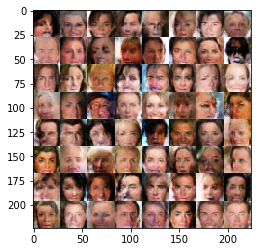

Epoch 1/1... Discriminator Loss: 0.8834... Generator Loss: 1.1772
Epoch 1/1... Discriminator Loss: 0.8091... Generator Loss: 1.3556
Epoch 1/1... Discriminator Loss: 0.9215... Generator Loss: 1.3562
Epoch 1/1... Discriminator Loss: 0.9871... Generator Loss: 0.9341
Epoch 1/1... Discriminator Loss: 0.7721... Generator Loss: 1.3890
Epoch 1/1... Discriminator Loss: 1.2519... Generator Loss: 0.6248
Epoch 1/1... Discriminator Loss: 0.6798... Generator Loss: 1.9987
Epoch 1/1... Discriminator Loss: 0.8057... Generator Loss: 1.2485
Epoch 1/1... Discriminator Loss: 0.8099... Generator Loss: 1.3859
Epoch 1/1... Discriminator Loss: 0.7748... Generator Loss: 1.7962


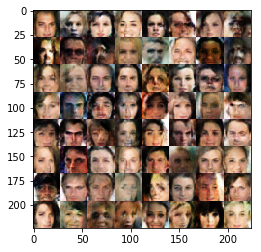

Epoch 1/1... Discriminator Loss: 0.9823... Generator Loss: 0.9983
Epoch 1/1... Discriminator Loss: 0.9442... Generator Loss: 0.9780
Epoch 1/1... Discriminator Loss: 0.7878... Generator Loss: 1.4842
Epoch 1/1... Discriminator Loss: 1.1085... Generator Loss: 1.4235
Epoch 1/1... Discriminator Loss: 0.9057... Generator Loss: 1.0264
Epoch 1/1... Discriminator Loss: 1.4231... Generator Loss: 0.5406
Epoch 1/1... Discriminator Loss: 0.8479... Generator Loss: 1.4273
Epoch 1/1... Discriminator Loss: 1.1083... Generator Loss: 0.7801
Epoch 1/1... Discriminator Loss: 0.8463... Generator Loss: 1.2227
Epoch 1/1... Discriminator Loss: 0.6356... Generator Loss: 1.7954


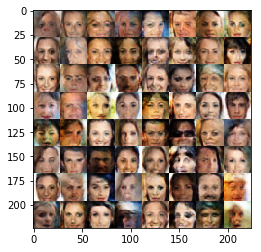

Epoch 1/1... Discriminator Loss: 0.9339... Generator Loss: 1.1612
Epoch 1/1... Discriminator Loss: 0.7725... Generator Loss: 1.5513
Epoch 1/1... Discriminator Loss: 0.7798... Generator Loss: 1.3199
Epoch 1/1... Discriminator Loss: 1.0861... Generator Loss: 0.8194
Epoch 1/1... Discriminator Loss: 0.8906... Generator Loss: 1.3865
Epoch 1/1... Discriminator Loss: 0.9048... Generator Loss: 1.0200
Epoch 1/1... Discriminator Loss: 0.7469... Generator Loss: 1.3212
Epoch 1/1... Discriminator Loss: 0.8130... Generator Loss: 1.3396
Epoch 1/1... Discriminator Loss: 0.9003... Generator Loss: 2.5984
Epoch 1/1... Discriminator Loss: 0.9281... Generator Loss: 1.9833


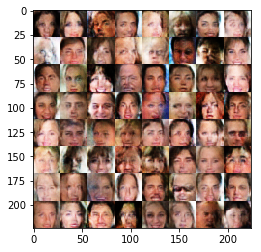

Epoch 1/1... Discriminator Loss: 0.8677... Generator Loss: 1.1454
Epoch 1/1... Discriminator Loss: 0.6525... Generator Loss: 1.7870
Epoch 1/1... Discriminator Loss: 0.9032... Generator Loss: 1.0407
Epoch 1/1... Discriminator Loss: 0.8282... Generator Loss: 1.3296
Epoch 1/1... Discriminator Loss: 0.7652... Generator Loss: 1.5285
Epoch 1/1... Discriminator Loss: 0.8830... Generator Loss: 1.0685
Epoch 1/1... Discriminator Loss: 0.8677... Generator Loss: 1.1005
Epoch 1/1... Discriminator Loss: 0.9105... Generator Loss: 1.1781
Epoch 1/1... Discriminator Loss: 0.9122... Generator Loss: 1.3217
Epoch 1/1... Discriminator Loss: 0.9147... Generator Loss: 1.6385


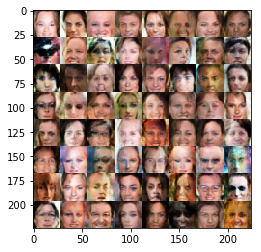

Epoch 1/1... Discriminator Loss: 1.0184... Generator Loss: 1.0404
Epoch 1/1... Discriminator Loss: 0.7922... Generator Loss: 1.2378
Epoch 1/1... Discriminator Loss: 0.8243... Generator Loss: 1.1729
Epoch 1/1... Discriminator Loss: 0.8154... Generator Loss: 1.9462
Epoch 1/1... Discriminator Loss: 1.0702... Generator Loss: 0.8117
Epoch 1/1... Discriminator Loss: 0.7347... Generator Loss: 1.4611
Epoch 1/1... Discriminator Loss: 1.0777... Generator Loss: 1.4502
Epoch 1/1... Discriminator Loss: 0.7546... Generator Loss: 1.5291
Epoch 1/1... Discriminator Loss: 0.7940... Generator Loss: 1.8166
Epoch 1/1... Discriminator Loss: 0.7727... Generator Loss: 2.2536


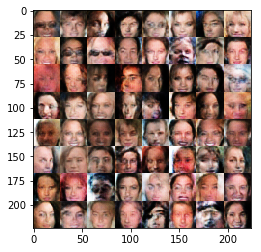

Epoch 1/1... Discriminator Loss: 1.0908... Generator Loss: 0.8248
Epoch 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.5330
Epoch 1/1... Discriminator Loss: 0.9647... Generator Loss: 1.0355
Epoch 1/1... Discriminator Loss: 0.8853... Generator Loss: 1.0967
Epoch 1/1... Discriminator Loss: 0.7904... Generator Loss: 1.3714
Epoch 1/1... Discriminator Loss: 1.0882... Generator Loss: 0.9315
Epoch 1/1... Discriminator Loss: 0.7859... Generator Loss: 1.3696
Epoch 1/1... Discriminator Loss: 1.0517... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 0.9704... Generator Loss: 0.9993
Epoch 1/1... Discriminator Loss: 0.8300... Generator Loss: 1.1632


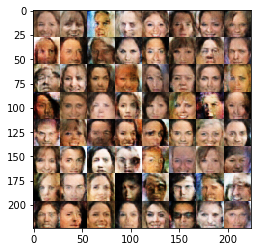

Epoch 1/1... Discriminator Loss: 0.7825... Generator Loss: 1.6140
Epoch 1/1... Discriminator Loss: 0.9131... Generator Loss: 0.9893
Epoch 1/1... Discriminator Loss: 0.8475... Generator Loss: 1.2137
Epoch 1/1... Discriminator Loss: 0.7839... Generator Loss: 1.5840
Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 0.6802
Epoch 1/1... Discriminator Loss: 0.9184... Generator Loss: 1.4075
Epoch 1/1... Discriminator Loss: 0.8856... Generator Loss: 1.2275
Epoch 1/1... Discriminator Loss: 0.6686... Generator Loss: 2.0828
Epoch 1/1... Discriminator Loss: 1.0583... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 0.9825... Generator Loss: 0.9556


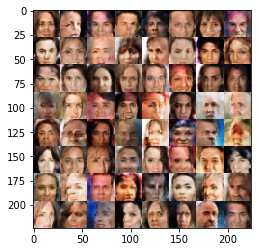

Epoch 1/1... Discriminator Loss: 0.7362... Generator Loss: 1.8869
Epoch 1/1... Discriminator Loss: 0.8478... Generator Loss: 1.2881
Epoch 1/1... Discriminator Loss: 0.7294... Generator Loss: 1.8504
Epoch 1/1... Discriminator Loss: 0.5847... Generator Loss: 2.2454
Epoch 1/1... Discriminator Loss: 1.0712... Generator Loss: 0.8329
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.5520
Epoch 1/1... Discriminator Loss: 0.9942... Generator Loss: 0.9966
Epoch 1/1... Discriminator Loss: 0.7277... Generator Loss: 1.9646
Epoch 1/1... Discriminator Loss: 0.8495... Generator Loss: 1.3528
Epoch 1/1... Discriminator Loss: 0.7237... Generator Loss: 1.5678


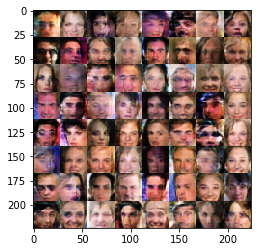

Epoch 1/1... Discriminator Loss: 0.6520... Generator Loss: 2.0130
Epoch 1/1... Discriminator Loss: 1.6300... Generator Loss: 0.3773
Epoch 1/1... Discriminator Loss: 0.9527... Generator Loss: 0.9708
Epoch 1/1... Discriminator Loss: 1.0879... Generator Loss: 0.7844
Epoch 1/1... Discriminator Loss: 0.8955... Generator Loss: 1.1585
Epoch 1/1... Discriminator Loss: 0.9611... Generator Loss: 1.7972
Epoch 1/1... Discriminator Loss: 1.0093... Generator Loss: 0.9139
Epoch 1/1... Discriminator Loss: 0.9744... Generator Loss: 0.9848
Epoch 1/1... Discriminator Loss: 0.7725... Generator Loss: 1.6171
Epoch 1/1... Discriminator Loss: 0.9479... Generator Loss: 0.9023


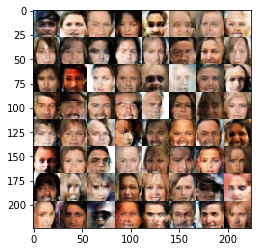

Epoch 1/1... Discriminator Loss: 1.0030... Generator Loss: 0.9771
Epoch 1/1... Discriminator Loss: 0.8453... Generator Loss: 1.1322
Epoch 1/1... Discriminator Loss: 1.2181... Generator Loss: 0.6823
Epoch 1/1... Discriminator Loss: 1.1693... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 0.8546... Generator Loss: 1.2503
Epoch 1/1... Discriminator Loss: 0.8833... Generator Loss: 1.1606


In [ ]:
batch_size = 40
z_dim = 100
learning_rate = 0.0003
beta1 = 0.15


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.